Aim is to create an image slice of the lung and segment the lung area (black = lung, white = non-lung). We can then create a poisson density map measuring the distance of each pixel/voxel to the lung edge, and annotate a set of axes that will allow for positional transformations between lung images.

In [1]:
import SimpleITK as sitk
import os
import numpy as np
import ipywidgets as widgets
import matplotlib.pyplot as plt
import ipyvolume as ipv
from scipy.ndimage import zoom
import gui
%matplotlib notebook

ModuleNotFoundError: No module named 'numpy'

In [2]:
# Callback invoked by the IPython interact method for scrolling and modifying the alpha blending
# of an image stack of two images that occupy the same physical space. 
def display_images_with_alpha(image_z, alpha, fixed, moving):
    img = (1.0 - alpha)*fixed[:,:,image_z] + alpha*moving[:,:,image_z] 
    plt.imshow(sitk.GetArrayViewFromImage(img),cmap=plt.cm.Greys_r);
    plt.axis('off')
    plt.show()
    
# Callback invoked when the StartEvent happens, sets up our new data.
def start_plot():
    global metric_values, multires_iterations
    
    metric_values = []
    multires_iterations = []

# Callback invoked when the EndEvent happens, do cleanup of data and figure.
def end_plot():
    global metric_values, multires_iterations
    
    del metric_values
    del multires_iterations
    # Close figure, we don't want to get a duplicate of the plot latter on.
    plt.close()

# Callback invoked when the IterationEvent happens, update our data and display new figure.    
def plot_values(registration_method):
    global metric_values, multires_iterations
    
    metric_values.append(registration_method.GetMetricValue())                                       
    # Clear the output area (wait=True, to reduce flickering), and plot current data
    clear_output(wait=True)
    # Plot the similarity metric values
    plt.plot(metric_values, 'r')
    plt.plot(multires_iterations, [metric_values[index] for index in multires_iterations], 'b*')
    plt.xlabel('Iteration Number',fontsize=12)
    plt.ylabel('Metric Value',fontsize=12)
    plt.show()
    
# Callback invoked when the sitkMultiResolutionIterationEvent happens, update the index into the 
# metric_values list. 
def update_multires_iterations():
    global metric_values, multires_iterations
    multires_iterations.append(len(metric_values))
    
def myshow(img, title=None, margin=0.05, dpi=80):
    nda = sitk.GetArrayViewFromImage(img)
    spacing = img.GetSpacing()
        
    if nda.ndim == 3:
        # fastest dim, either component or x
        c = nda.shape[-1]
        
        # the the number of components is 3 or 4 consider it an RGB image
        if not c in (3,4):
            nda = nda[nda.shape[0]//2,:,:]
    
    elif nda.ndim == 4:
        c = nda.shape[-1]
        
        if not c in (3,4):
            raise Runtime("Unable to show 3D-vector Image")
            
        # take a z-slice
        nda = nda[nda.shape[0]//2,:,:,:]
            
    ysize = nda.shape[0]
    xsize = nda.shape[1]
      
    # Make a figure big enough to accommodate an axis of xpixels by ypixels
    # as well as the ticklabels, etc...
    figsize = (1 + margin) * ysize / dpi, (1 + margin) * xsize / dpi

    fig = plt.figure(figsize=figsize, dpi=dpi)
    # Make the axis the right size...
    ax = fig.add_axes([margin, margin, 1 - 2*margin, 1 - 2*margin])
    
    extent = (0, xsize*spacing[1], ysize*spacing[0], 0)
    
    t = ax.imshow(nda,extent=extent,interpolation=None)
    
    if nda.ndim == 2:
        t.set_cmap("gray")
    
    if(title):
        plt.title(title)

In [3]:
series_reader = sitk.ImageSeriesReader()
cur_paths = series_reader.GetGDCMSeriesFileNames("/home/share/rochester_CT/Lungmap_D205_anonymized_RightLung/Right Lung/AX BONE .67 - 3")
img = sitk.ReadImage(cur_paths)

In [4]:
img = sitk.RescaleIntensity(img)

## 2D image extraction and segmentation

In [5]:
nda = sitk.GetArrayViewFromImage(img)
plt.imshow(nda[:,:,280])
plt.show()

ImportError: NumPy not available.

In [115]:
series_reader = sitk.ImageSeriesReader()
cur_paths = series_reader.GetGDCMSeriesFileNames("/home/share/rochester_CT/Lungmap_D122_anonymized_RightLung/Localizers/AX 1024 - 3/")
img2 = sitk.ReadImage(cur_paths)
img2 = sitk.RescaleIntensity(img2)

<IPython.core.display.Javascript object>


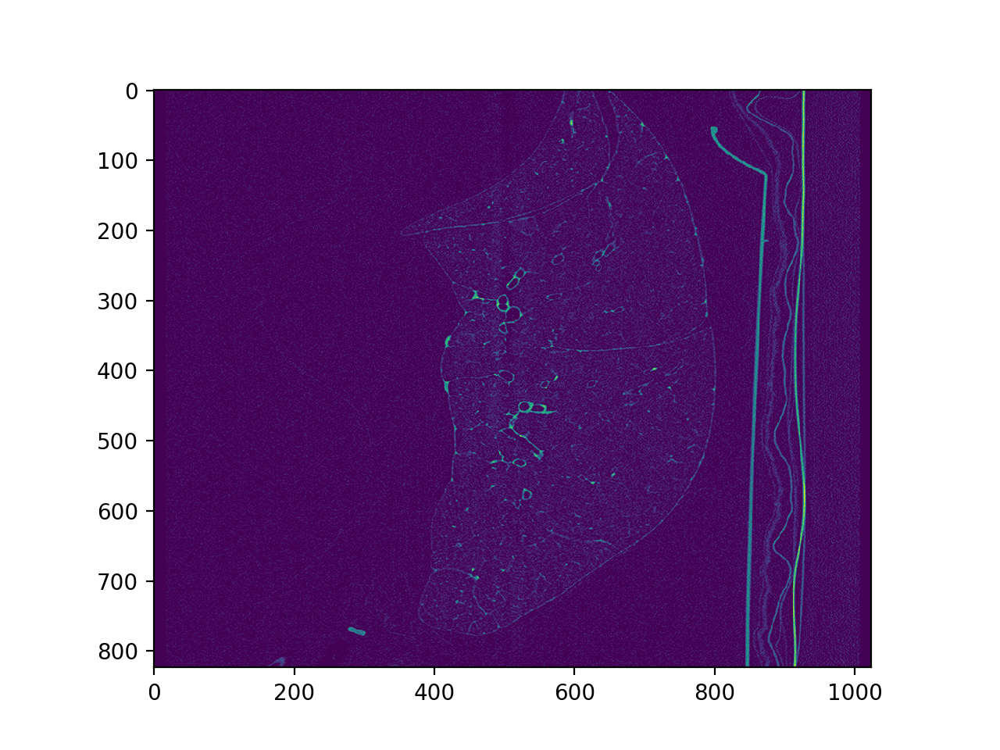

In [116]:
nda2 = sitk.GetArrayViewFromImage(img2)
plt.imshow(nda2[:,:,380])
plt.show()

In [117]:
l1 = nda[:,:,280]
l2 = nda2[:,:,380]

## Segment 3D and take the same 2D slices to get segmented 2D view

### Smoothing

In [118]:
img_denoise = sitk.CurvatureFlow(
    image1=img,
    timeStep=0.01,
    numberOfIterations=30
)

<IPython.core.display.Javascript object>


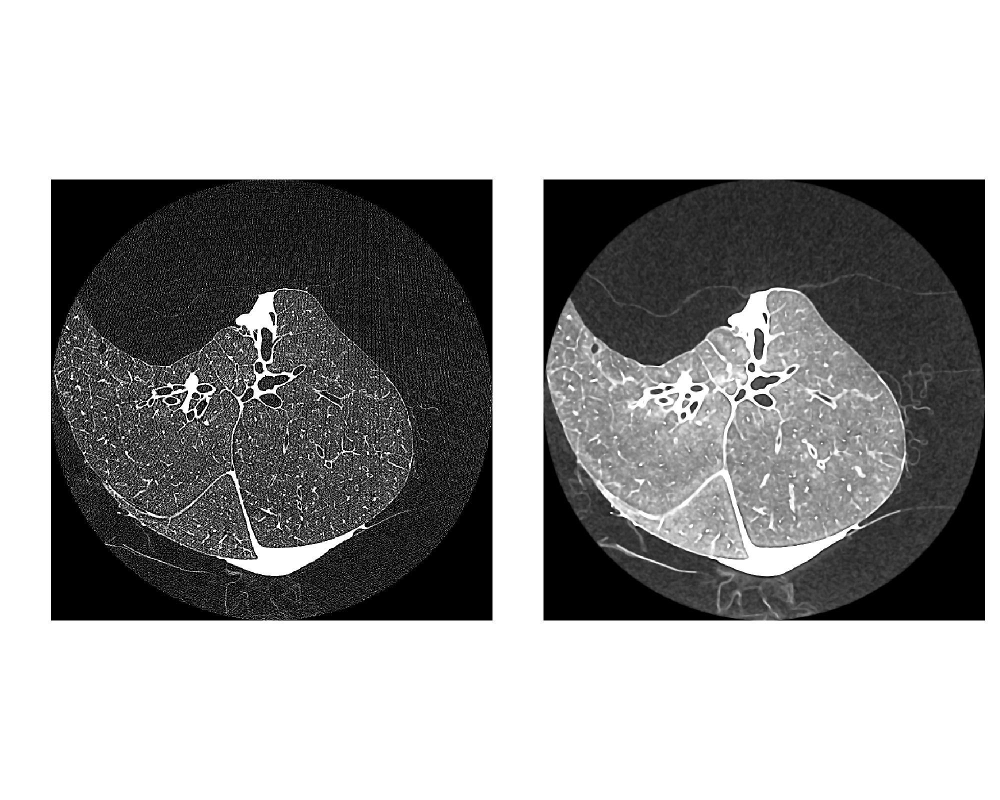

In [119]:
gui.MultiImageDisplay([img, img_denoise])

<IPython.core.display.Javascript object>


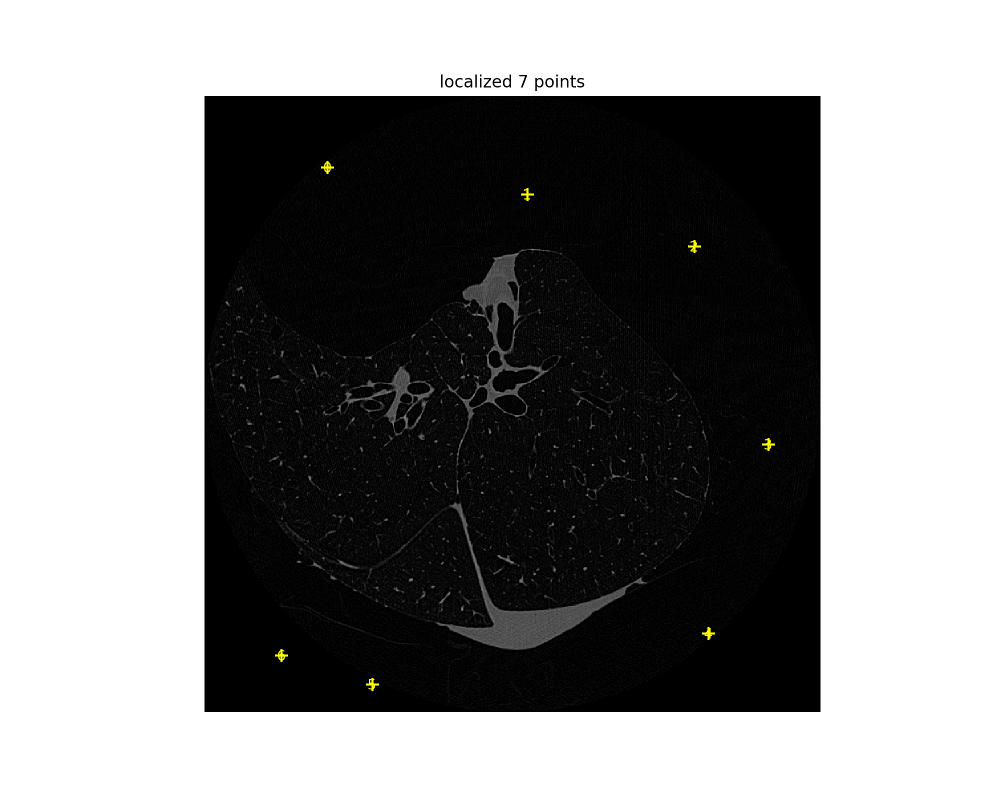

In [79]:
point_acquisition_interface = gui.PointDataAquisition(img)

In [80]:
initial_seed_point_indexes = point_acquisition_interface.get_point_indexes()

In [81]:
initial_seed_point_indexes

[(153, 89, 411),
 (402, 122, 411),
 (611, 187, 411),
 (703, 434, 411),
 (628, 670, 411),
 (209, 733, 411),
 (96, 697, 411)]

Can try confidence connected image filter and connected threshold image filter for segmenting the outside region

In [126]:
background_segmentation = sitk.ConnectedThreshold(
    img_denoise,
    seedList=initial_seed_point_indexes,
    lower = 0,
    upper = 3,
    replaceValue=1
)

In [127]:
img_int = sitk.Cast(sitk.RescaleIntensity(img_denoise), background_segmentation.GetPixelID())

<IPython.core.display.Javascript object>


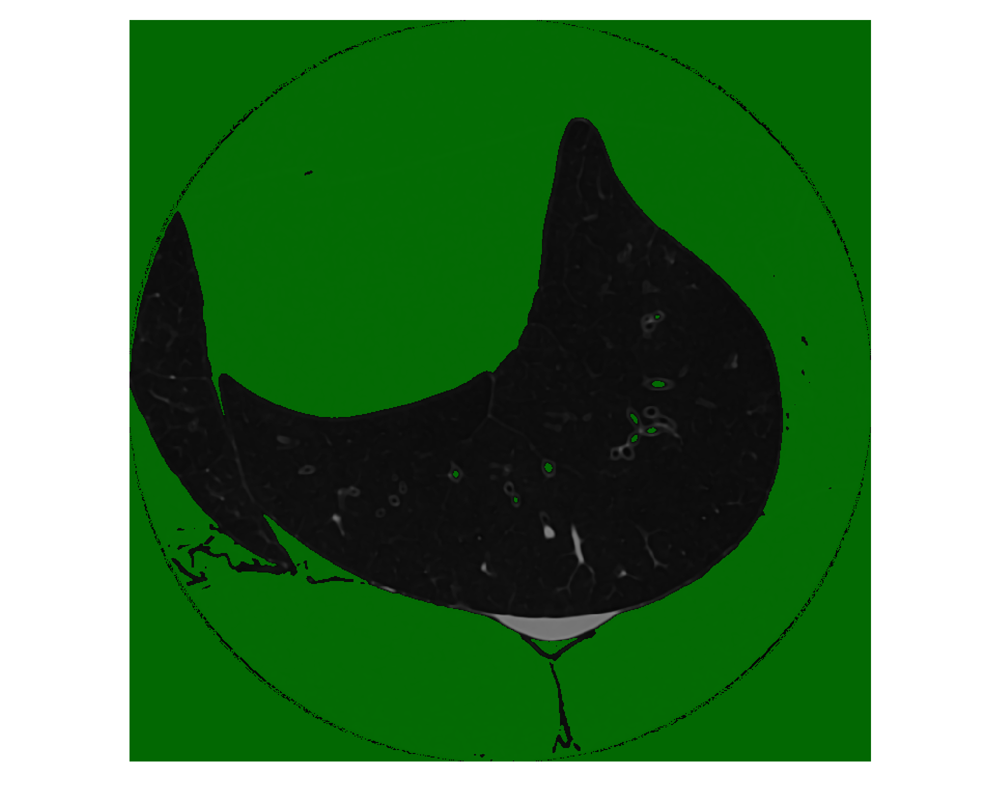

In [128]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(img_int, background_segmentation)])

In [330]:
bd = sitk.BinaryDilateImageFilter()
bd.SetKernelRadius(15)

erode = sitk.BinaryErodeImageFilter()
erode.SetKernelRadius(10)

In [331]:
cleaned = bd.Execute(background_segmentation)

In [332]:
closed = erode.Execute(cleaned)

In [338]:
erode.SetKernelRadius(5)
closed = erode.Execute(closed)

<IPython.core.display.Javascript object>


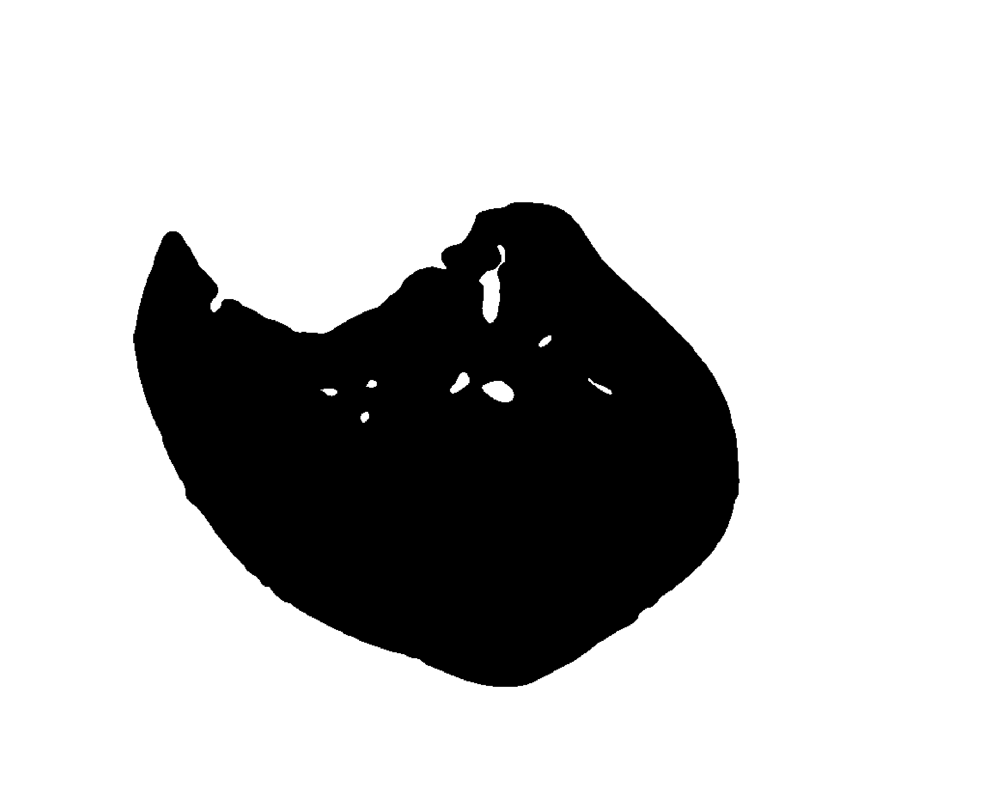

In [324]:
gui.MultiImageDisplay([closed])

Fill holes with BinaryFillHoleImageFilter

Save slice from the mask for 2D silhouette of the lung

In [339]:
img_seg = 1 - closed

<IPython.core.display.Javascript object>


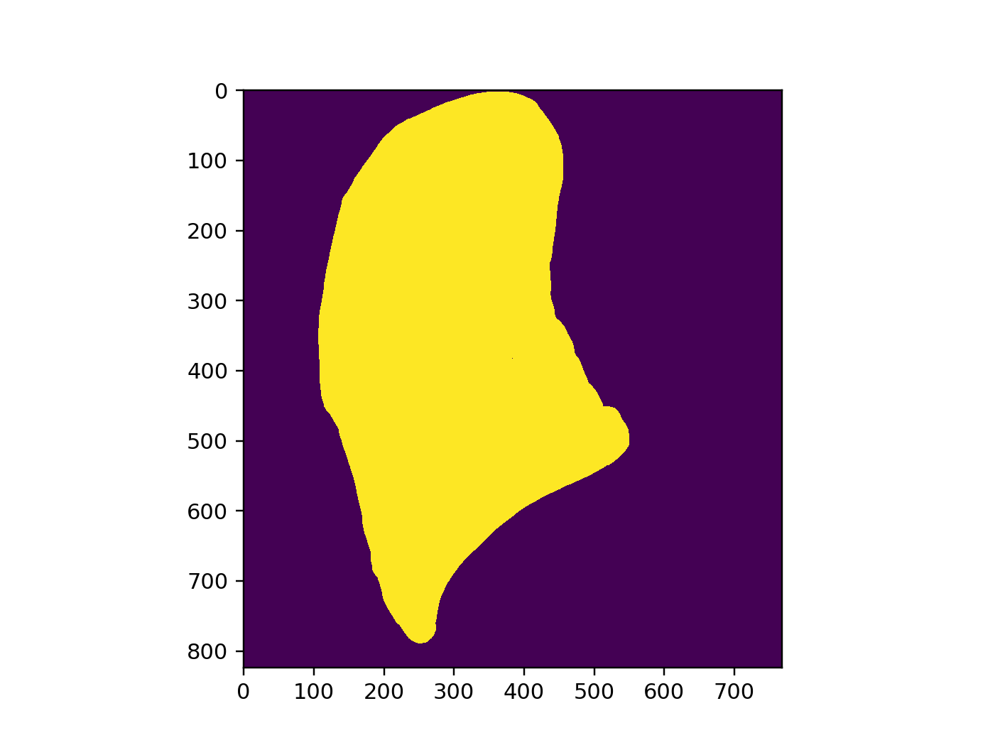

In [413]:
nda = sitk.GetArrayViewFromImage(img_seg)
array_use = np.rot90(nda[:,:,270])
plt.imshow(np.rot90(array_use))
plt.show()

In [414]:
np.rot90(array_use).tofile(file = 'D205_slice270.txt', sep = '\t')

<IPython.core.display.Javascript object>


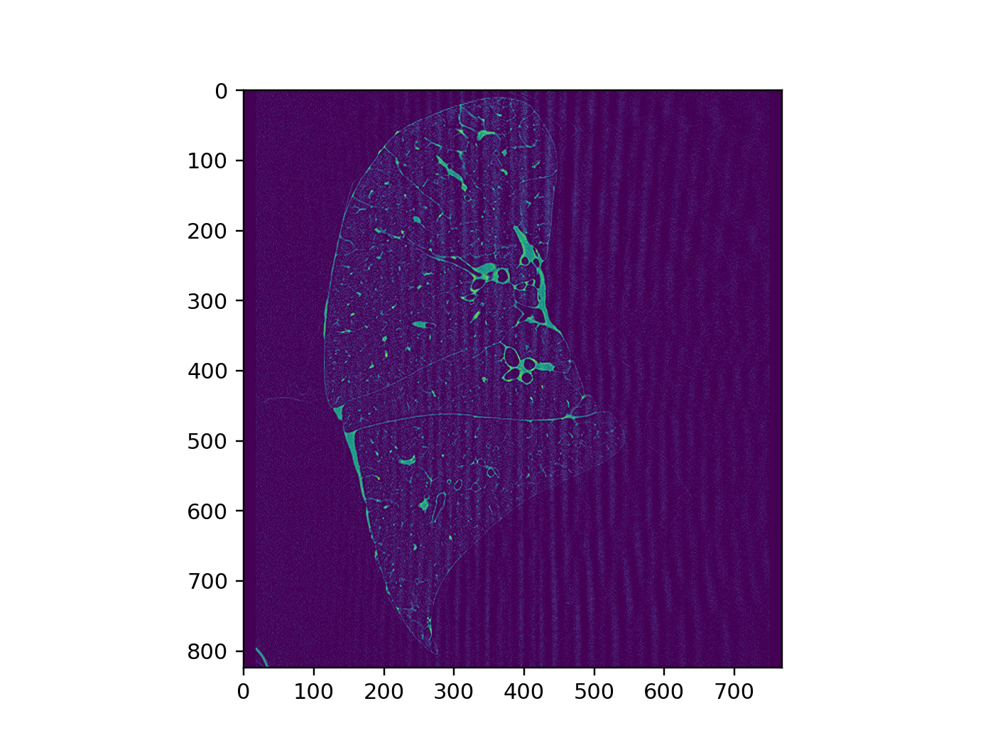

In [415]:
nda = sitk.GetArrayViewFromImage(img)
array_use = np.rot90(nda[:,:,270])
plt.imshow(np.rot90(array_use))
plt.show()

In [416]:
nda = np.rot90(np.rot90(nda))

<IPython.core.display.Javascript object>


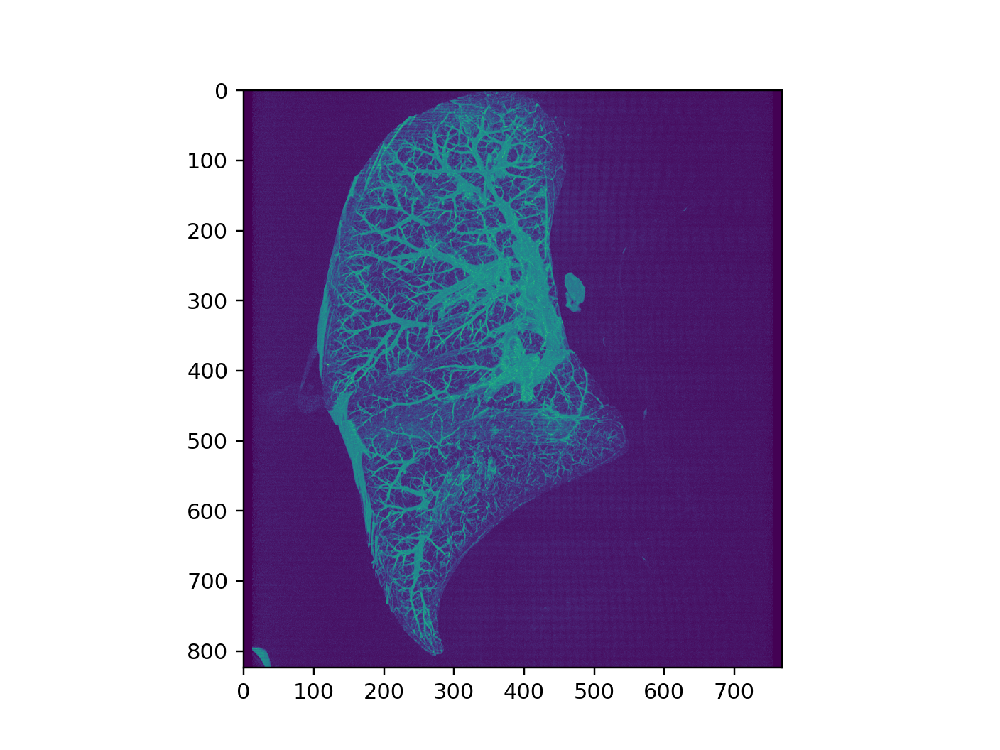

In [417]:
plt.imshow(np.max(nda[:,:,230:290], 2))

Run on the other lung

In [277]:
img2 = sitk.RescaleIntensity(img2)

<IPython.core.display.Javascript object>


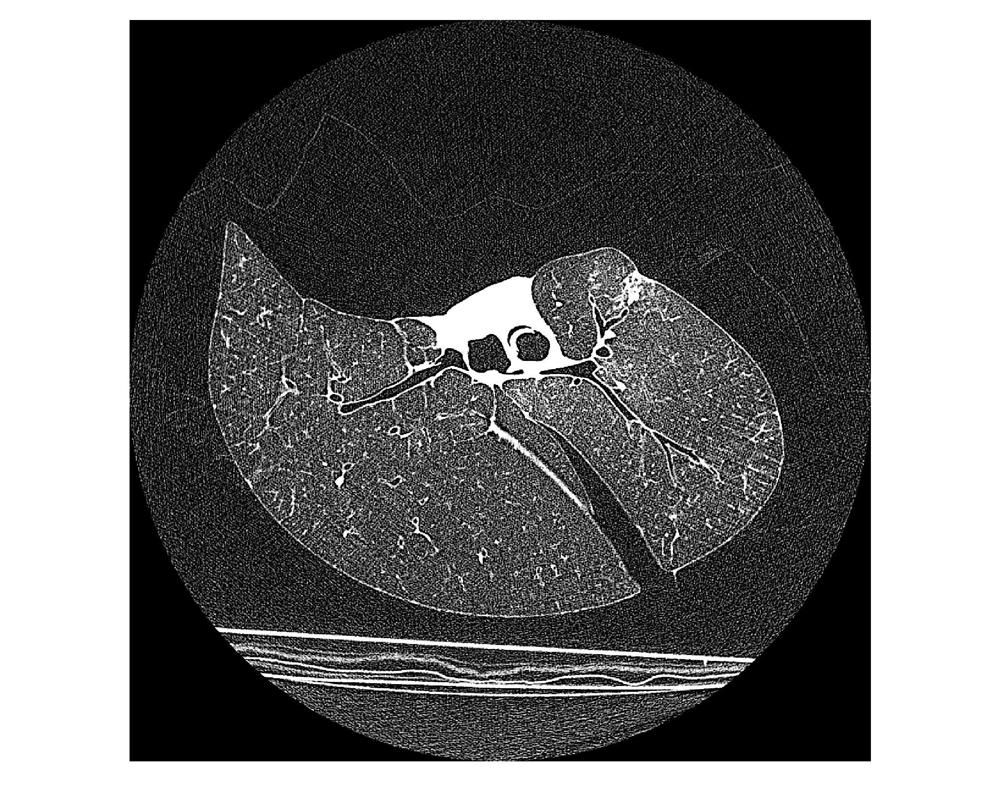

In [278]:
gui.MultiImageDisplay([img2])

In [281]:
img_denoise2 = sitk.CurvatureFlow(
    image1=img2,
    timeStep=0.01,
    numberOfIterations=30
)

<IPython.core.display.Javascript object>


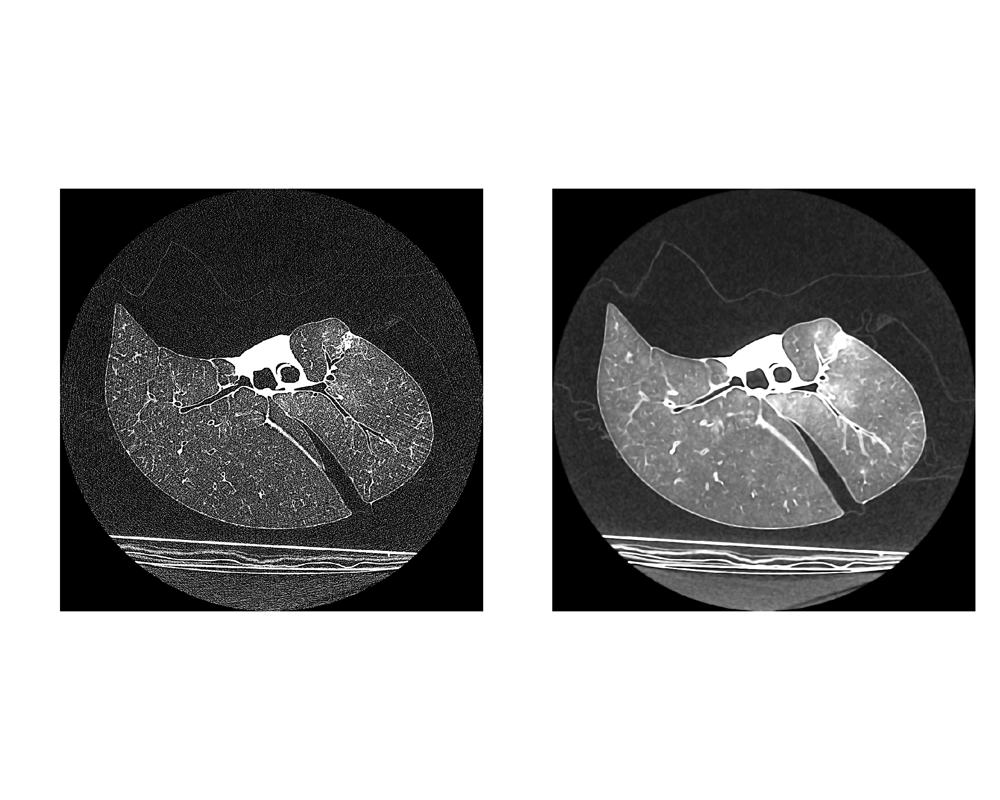

In [282]:
gui.MultiImageDisplay([img2, img_denoise2])

<IPython.core.display.Javascript object>


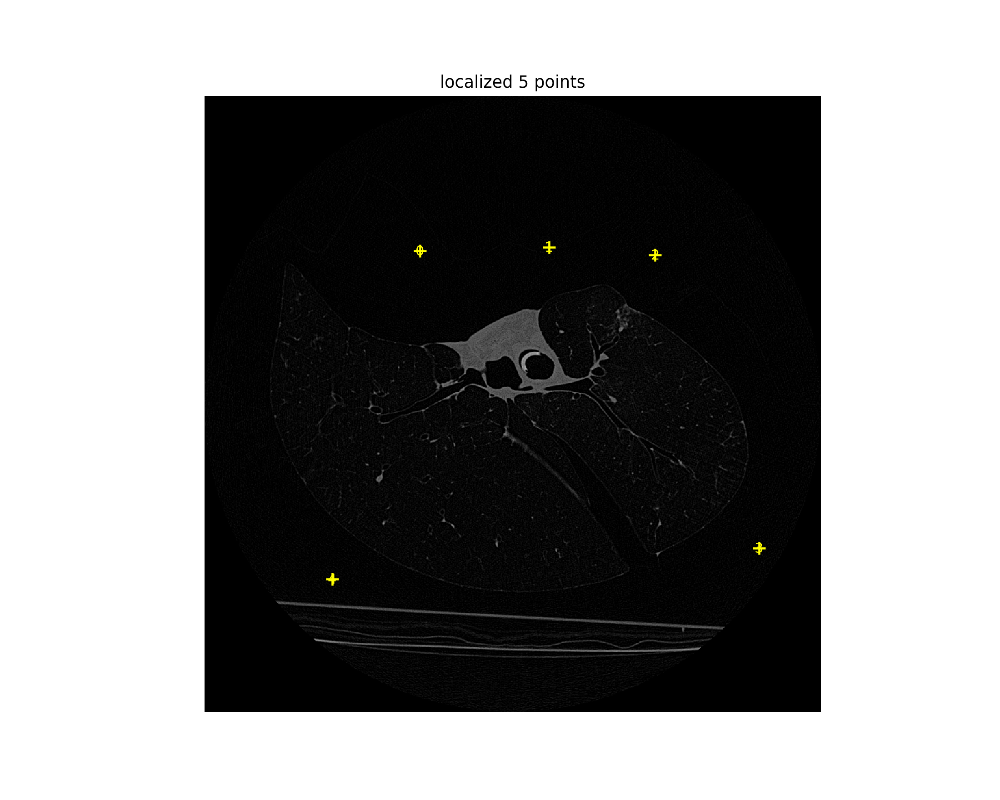

In [283]:
point_acquisition_interface = gui.PointDataAquisition(img2)

In [284]:
initial_seed_point_indexes = point_acquisition_interface.get_point_indexes()

In [285]:
background_segmentation2 = sitk.ConnectedThreshold(
    img_denoise2,
    seedList=initial_seed_point_indexes,
    lower = 0,
    upper = 3,
    replaceValue=1
)

<IPython.core.display.Javascript object>


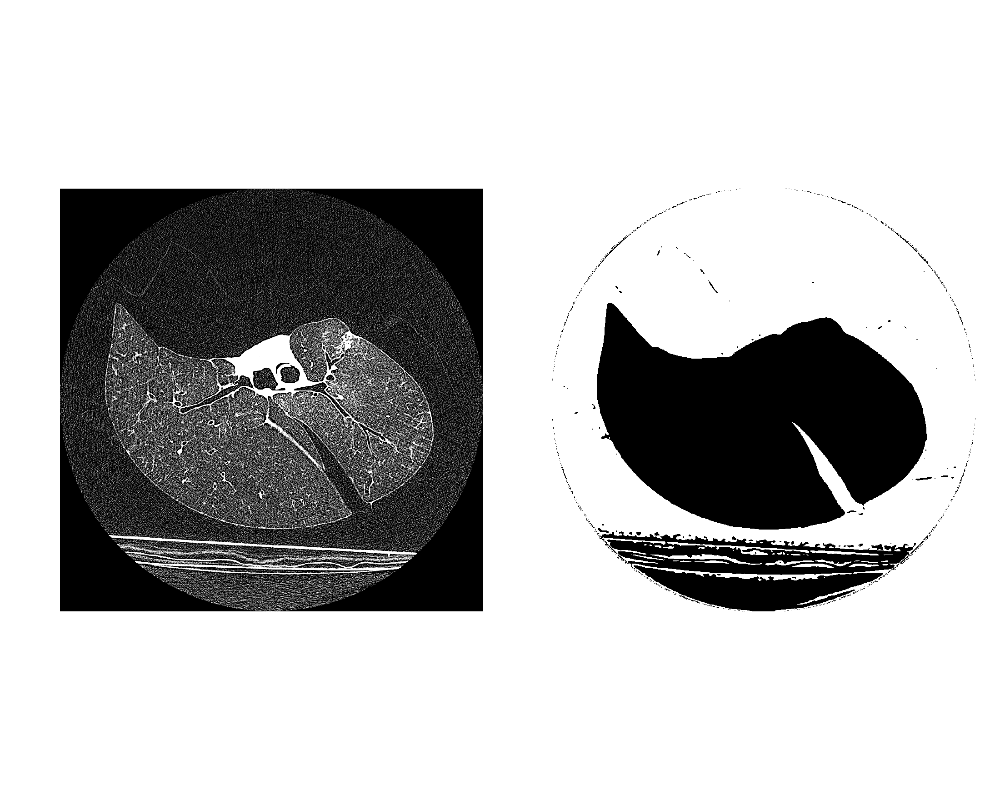

In [286]:
gui.MultiImageDisplay([img2, background_segmentation2])

In [287]:
cleaned2 = bd.Execute(background_segmentation2)
closed2 = erode.Execute(cleaned2)

crop

In [302]:
closed_crop = closed2[:, :850, :]

In [314]:
img2_seg = 1 - closed_crop

<IPython.core.display.Javascript object>


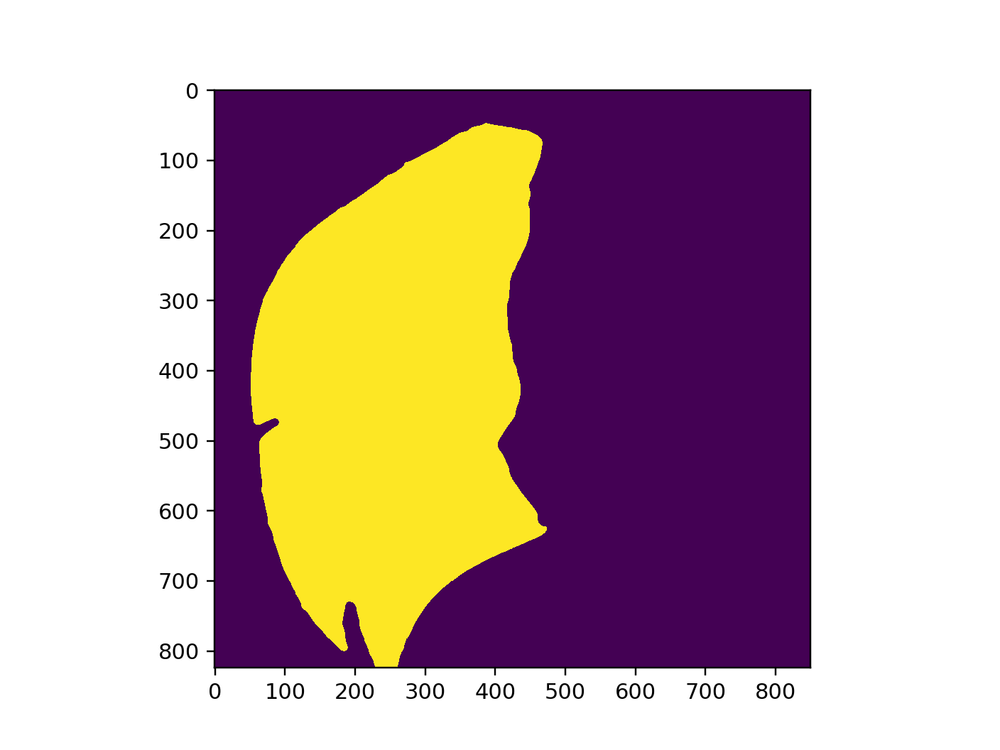

In [343]:
nda = sitk.GetArrayViewFromImage(img2_seg)
array_use = np.rot90(nda[:,:,380])
plt.imshow(np.rot90(array_use))
plt.show()

Save as txt

In [355]:
np.rot90(array_use).tofile(file = 'D122_slice380.txt', sep='\t')

<IPython.core.display.Javascript object>


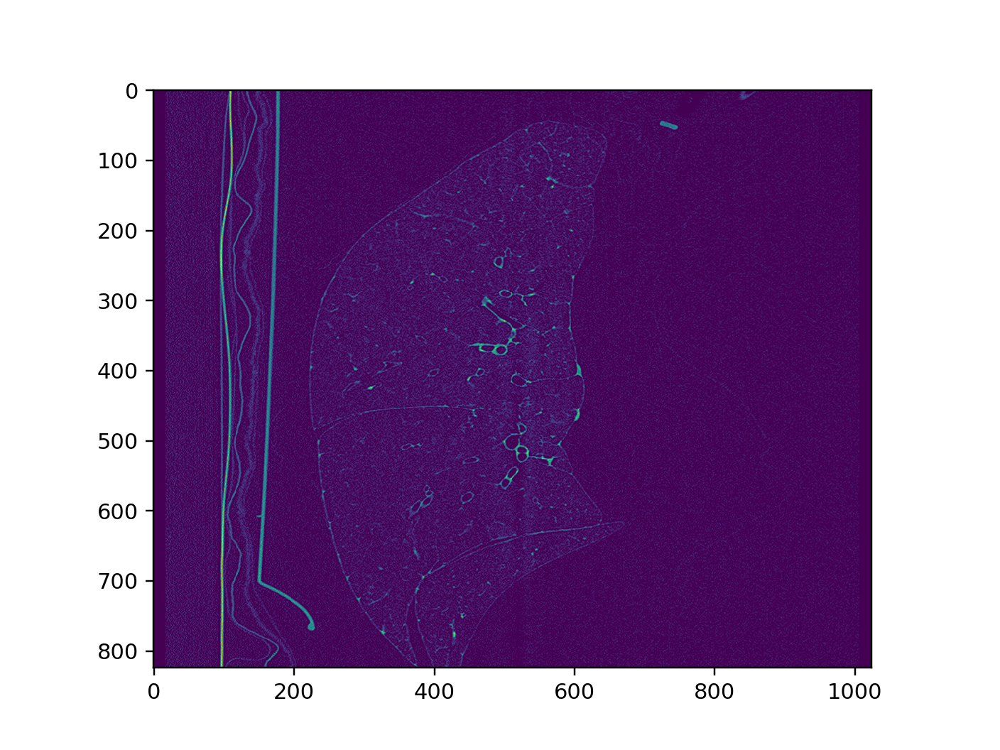

In [378]:
nda = sitk.GetArrayViewFromImage(img2)
array_use = np.rot90(nda[:,:,380])
plt.imshow(np.rot90(array_use))
plt.show()

In [358]:
nda.shape

(824, 1024, 1024)

In [379]:
nda = np.rot90(np.rot90(nda))

<IPython.core.display.Javascript object>


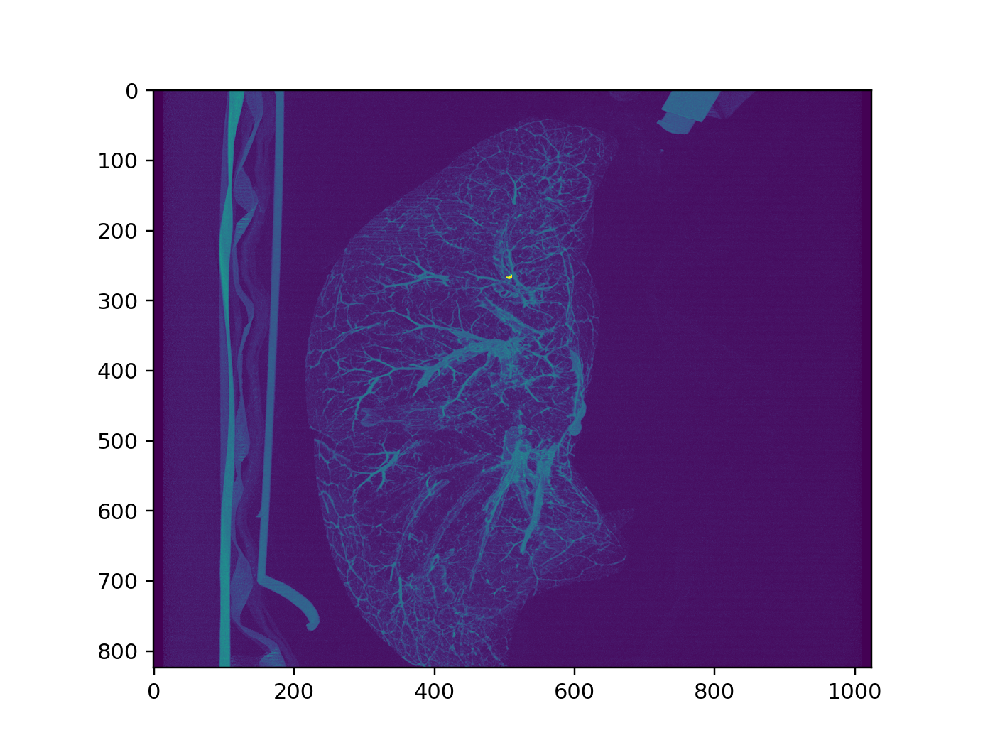

In [391]:
plt.imshow(np.max(nda[:,:,280:400], 2))